In [3]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt

# import kmos_tools as KT
import matplotlib as mpl

import binotools as bt
import os, sys

# from astropy.io import fits
# from astropy.wcs import WCS
# from astropy.utils.data import get_pkg_data_filename
# from astropy import units as u
# from astropy.convolution import Gaussian2DKernel, convolve
# import photutils
# from lmfit.models import GaussianModel, SkewedGaussianModel


mpl.rcParams['font.size'] = 18

import logging

logging.getLogger().setLevel(logging.WARNING)

c=3.e5

plt.style.use('seaborn-talk')
from matplotlib import rc_file
rc_file(os.environ['WORK_DIR']+'/code/matplotlibrc')

plt.rc('figure', dpi=150, figsize=(5,5))

# Plot spectra for different priorities

In [95]:
data_dir = os.environ['BINO_DIR']+'2649_BLAS_1/'

slits = pd.read_csv(data_dir+'masks/BLAS_1_slits.csv')

# fits file ext # = slits.index + 1
# slits['extnum'] = slits.index + 1

# slits = pd.read_csv(data_dir+'masks/BLAS_1_slits2.csv', sep='\t')

slits

,slit,targetnum,name,ra,dec,pmra,pmdec,mag,priority,epoch,type,wave_start,wave_end,side,extnum
0,22,778,3DHST_15563,188.950745,62.218903,0,0,0.001,6,2000,TARGET,7728.533648,10251.126548,A,1
1,23,818,3DHST_16476,188.950455,62.223740,0,0,0.001,6,2000,TARGET,7698.929822,10221.535552,A,2
2,27,872,3DHST_17848,188.946426,62.230289,0,0,0.001,6,2000,TARGET,7652.275725,10174.901935,A,3
3,33,908,3DHST_19025,188.946198,62.235584,0,0,0.001,6,2000,TARGET,7620.071986,10142.712164,A,4
4,37,931,3DHST_19661,188.949158,62.238186,0,0,0.001,6,2000,TARGET,7609.846845,10132.491259,A,5
5,36,919,3DHST_19285,188.968842,62.237110,0,0,0.001,6,2000,TARGET,7652.164596,10174.789393,A,6
6,35,918,3DHST_19281,188.978577,62.236897,0,0,0.001,6,2000,TARGET,7671.224746,10193.840674,A,7
7,32,902,3DHST_18839,188.993240,62.234818,0,0,0.001,6,2000,TARGET,7710.485386,10233.083389,A,8
8,44,999,3DHST_21508,188.987457,62.247871,0,0,0.001,6,2000,TARGET,7621.921607,10144.558506,A,9
9,46,1033,3DHST_22052,188.994080,62.250793,0,0,0.001,6,2000,TARGET,7616.667809,10139.306658,A,10


In [4]:
# Get data
datadir = os.environ['BINO_DIR']+'SAO-9/combined_fluxcalib/combine_47_frames_seeing<1.00arcsec_2019-11-07/'

fname_data = datadir+"combined_fluxcalib_abs_slits_lin.fits"
fname_err  = datadir+"combined_fluxcalib_abs_err_slits_linfits"

# Y offsets
target_offset_px = bt.bino_get_obj_ypos(fname_data, type='slits2D')

bino_plot = bt.BinoPlotter(fname_data)

# Stars

/home/cmason/anaconda2/envs/astroconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1545: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/cmason/anaconda2/envs/astroconda3/lib/python3.7/site-packages/Binotools-0.1.0-py3.7.egg/binotools/bino_plot.py:243: RuntimeWarning: invalid value encountered in true_divide


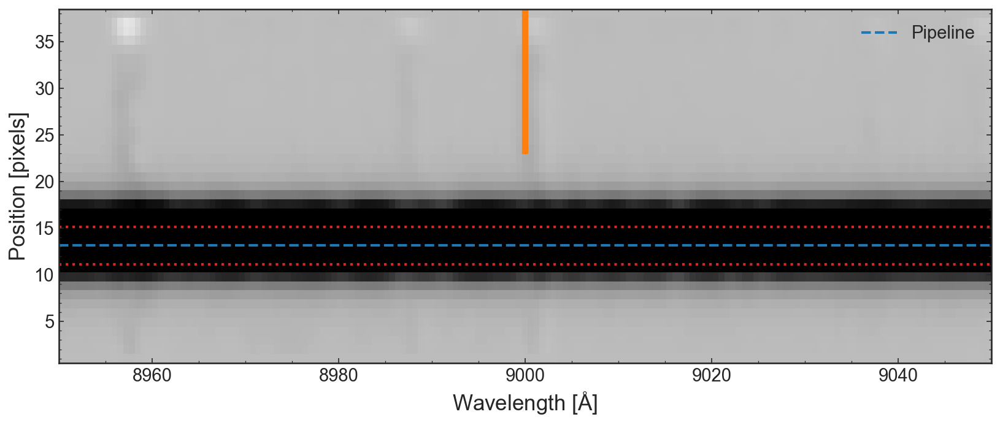

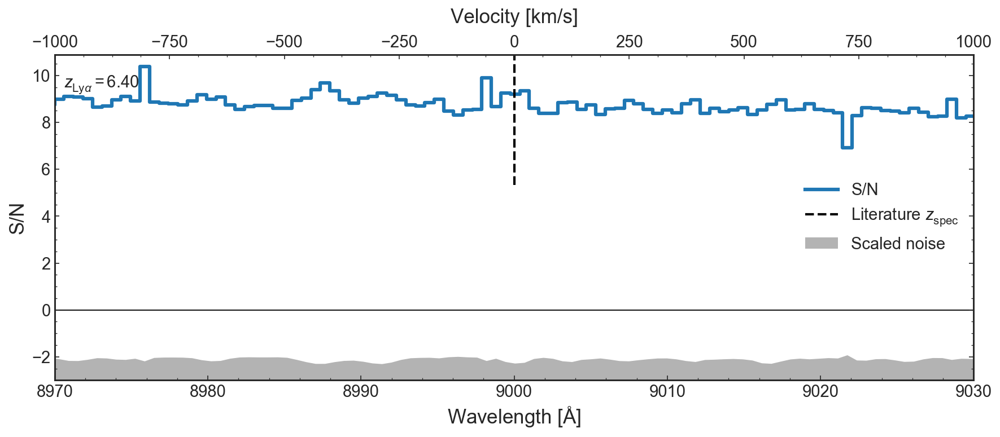

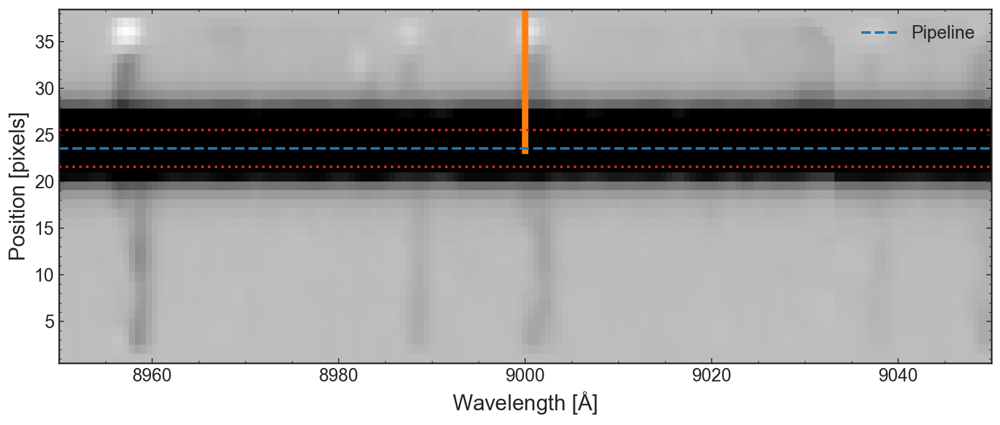

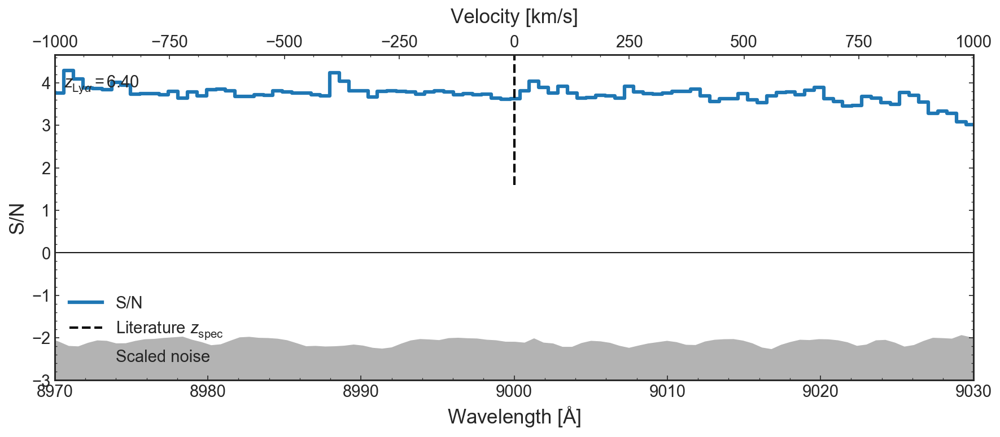

In [5]:
slits_stars = slits[slits.type == 'STANDARD']

# Line to center on
posy_width = 4.    # Pixel width of extraction window for 1D spectrum (4 pix = PSF from stars ~1")
wave_limA  = 30.   # Wavelength range to plot over (Lya_wave /pm wave_limA)

# Load data
for ss, s in slits_stars.iterrows():
    
    title    = s['name']
    targetid = s['extnum']


    Lya_wave = 9000. # Wavelength to center on

    image, ypos = bino_plot.spec2D(target=targetid, wave_lineA=Lya_wave, 
                                   posy_width=posy_width,
                                   wave_limA=wave_limA+20, find_peaks=False,
                                   posy=target_offset_px[targetid-1],
                                   vmin_sig=-0.3, vmax_sig=0.5, smooth=1)

    ypos = target_offset_px[targetid-1]
    bino_plot.spec1D(image, wave_lineA=Lya_wave,
                     posy_med=ypos, posy_width=posy_width,
                     wave_limA=wave_limA,
                     StoN=True)

# Pri =1 (z > 5)
 z_spec > 5 objects and plot their Bin spectra

In [6]:
pri1_slits = slits[slits.priority == 1]

pri1_slits

,slit,targetnum,name,ra,dec,pmra,pmdec,mag,priority,epoch,type,wave_start,wave_end,side,extnum
0,3,10,Stark11_43_3982,189.039261,62.247654,0,0,0.001,1,2000,TARGET,7718.780538,10241.372704,A,16
1,255,1916,f_3,188.910191,62.352588,0,0,0.001,1,2000,STANDARD,6855.558347,9378.533932,A,20
2,254,1915,f_2,188.902346,62.363999,0,0,0.001,1,2000,STANDARD,6773.112436,9296.124509,A,21
3,4,11,Jung18_z6_GND_5752,189.199585,62.320965,0,0,0.001,1,2000,TARGET,7592.815993,10115.463032,A,50
4,1,7,Hu10_z6_4,189.253998,62.353954,0,0,0.001,1,2000,TARGET,7509.007141,10031.694313,A,64
5,2,8,Stark11_35_22248,189.253998,62.353954,0,0,0.001,1,2000,TARGET,7509.007141,10031.694313,A,65
6,5,19,Stark11_35_22381,189.255386,62.357750,0,0,0.001,1,2000,TARGET,7489.939970,10012.635887,A,66
7,6,9,Hu10_z6_3,189.055939,62.129990,0,0,0.001,1,2000,TARGET,7402.424921,9925.164452,B,79
8,13,23,Stark11_42_6706,189.079712,62.141884,0,0,0.001,1,2000,TARGET,7421.763890,9944.492681,B,84
9,12,22,Stark11_41_13100,189.156693,62.115440,0,0,0.001,1,2000,TARGET,7115.139790,9638.003378,B,90


## Get zspec from literature data

In [31]:
target_dir = os.environ['WORK_DIR']+'/Observing/Binospec/Bino_analysis/targets/'
pri1_tab = pd.read_csv(target_dir+'target_lists/pri1_knownLAEs_cat_matchFinkelstein.dat', delimiter='\t', escapechar='#', skiprows=1)
pri1_tab

,ID,ra,dec,ID_Fink,z_Lya,z_Fink,Reference
0,Hu10_z6_5,189.399719,62.239494,z5_GND_22781,-99.000,5.33,Hu10
1,Hu10_z6_11,189.365982,62.196171,z5_GND_37006,-99.000,5.39,Hu10
2,Hu10_z6_12,189.320312,62.233444,z5_GND_24948,-99.000,5.43,Hu10
3,Hu10_z6_9,189.342285,62.262852,z5_GND_14430,-99.000,5.51,Hu10
4,Hu10_z6_7,189.032761,62.143970,z5_GNW_6135,5.640,5.01,Hu10
5,Hu10_z6_6,189.324554,62.299732,z5_GNW_23799,5.663,5.44,Hu10
6,Hu10_z6_4,189.253998,62.353954,z5_GNW_32160,-99.000,5.51,Hu10
7,Stark11_35_22248,189.253998,62.353954,z5_GNW_32160,5.700,5.51,Stark11
8,Hu10_z6_3,189.055939,62.129990,z5_GNW_3960,5.635,5.52,Hu10
9,Stark11_43_3982,189.039261,62.247654,z6_GND_21202,5.710,5.57,Stark11


## Match with slits

In [76]:
zspec = np.zeros(len(pri1_slits))
for i, slit in pri1_slits.iterrows():
    pri1_tab_match = pri1_tab[pri1_tab['ID'] == slit['name']]
    if len(pri1_tab_match) > 0:
        zspec[i] = pri1_tab_match['z_Lya']

pri1_slits['zspec'] = zspec
pri1_slits['Lya_wave'] = (zspec+1)*121.6
pri1_highz = pri1_slits.sort_values(by='extnum')[pri1_slits['zspec'] > 5]

pri1_highz[['extnum','name','ra','dec','side', 'zspec','Lya_wave']]
pri1_highz = pri1_highz.sort_values('zspec')
pri1_highz.reset_index(drop=True, inplace=True)
pri1_highz

/home/cmason/anaconda2/envs/astroconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/home/cmason/anaconda2/envs/astroconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,slit,targetnum,name,ra,dec,pmra,pmdec,mag,priority,epoch,type,wave_start,wave_end,side,extnum,zspec,Lya_wave
0,7,12,Stark11_42_13066,189.156387,62.197666,0,0,0.001,1,2000,TARGET,7589.721367,10112.369972,B,108,5.610,803.7760
1,6,9,Hu10_z6_3,189.055939,62.129990,0,0,0.001,1,2000,TARGET,7402.424921,9925.164452,B,79,5.635,806.8160
2,2,8,Stark11_35_22248,189.253998,62.353954,0,0,0.001,1,2000,TARGET,7509.007141,10031.694313,A,65,5.700,814.7200
3,5,19,Stark11_35_22381,189.255386,62.357750,0,0,0.001,1,2000,TARGET,7489.939970,10012.635887,A,66,5.700,814.7200
4,3,10,Stark11_43_3982,189.039261,62.247654,0,0,0.001,1,2000,TARGET,7718.780538,10241.372704,A,16,5.710,815.9360
5,8,13,Stark11_33_17705,189.208191,62.232140,0,0,0.001,1,2000,TARGET,7690.182193,10212.784911,B,126,5.800,826.8800
6,12,22,Stark11_41_13100,189.156693,62.115440,0,0,0.001,1,2000,TARGET,7115.139790,9638.003378,B,90,5.810,828.0960
7,13,23,Stark11_42_6706,189.079712,62.141884,0,0,0.001,1,2000,TARGET,7421.763890,9944.492681,B,84,5.970,847.5520
8,9,14,Stark11_32_16773,189.197800,62.199982,0,0,0.001,1,2000,TARGET,7522.548737,10045.226500,B,115,5.970,847.5520
9,10,17,Jung18_z6_GND_28438,189.177979,62.223713,0,0,0.001,1,2000,TARGET,7699.033945,10221.632991,B,118,6.551,918.2016


## Plot

In [82]:
edge_pix = 4

hdu_data = fits.open(fname_data)

dat2D_all = None
for i, slit in pri1_highz.iterrows():
    print(slit.extnum)
    dat2D = hdu_data[slit.extnum].data
        
    # exclude edges
#     dat2D_noedge = dat2D[edge_pix:-edge_pix,:]
    dat2D[:edge_pix]  = np.nan
    dat2D[-edge_pix:] = np.nan
    
    if i == 0:
        dat2D_all = dat2D
    else:
        dat2D_all = np.vstack((dat2D_all, dat2D))    

108
79
65
66
16
126
90
84
115
118
144
50


(7904.0, 9484.8)

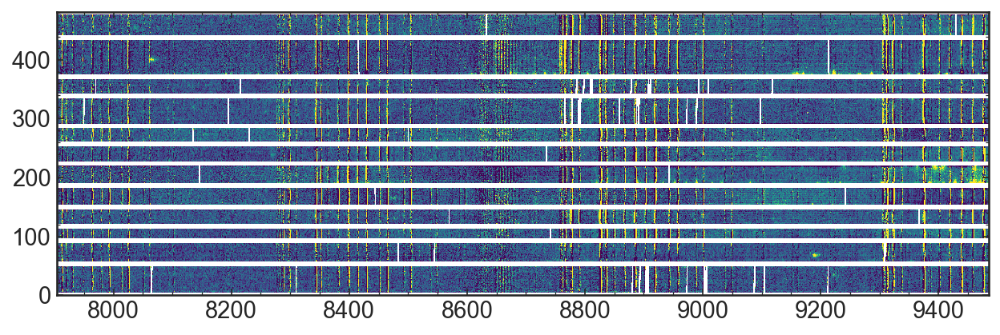

In [84]:
z = np.array([5.5, 6.8])

extent = [bino_plot.waveA.min(), bino_plot.waveA.max(),
          0.5, dat2D_all.shape[0]-0.5]

plt.figure(figsize=(10, 20), dpi=150)
plt.imshow(dat2D_all, origin='upper', extent=extent, vmin=0., vmax=5e-19)

plt.xlim((1+z)*1216)

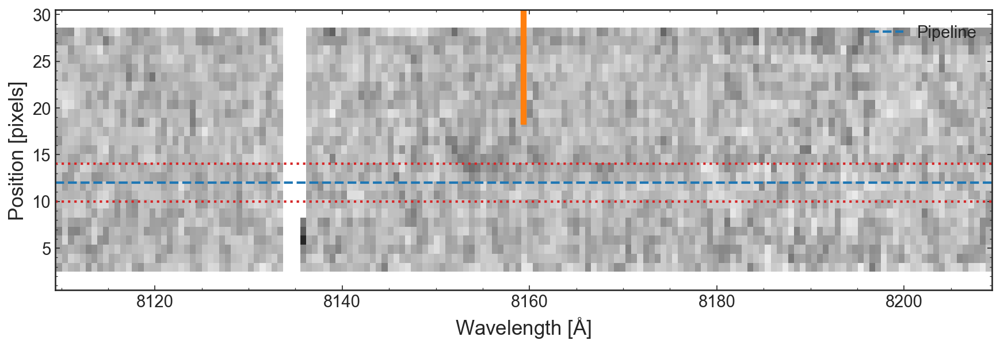

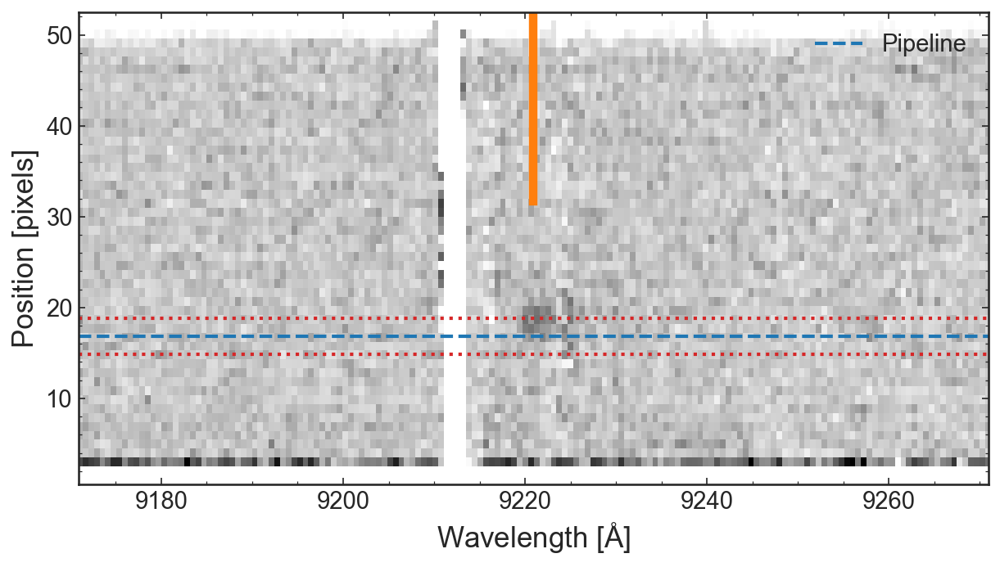

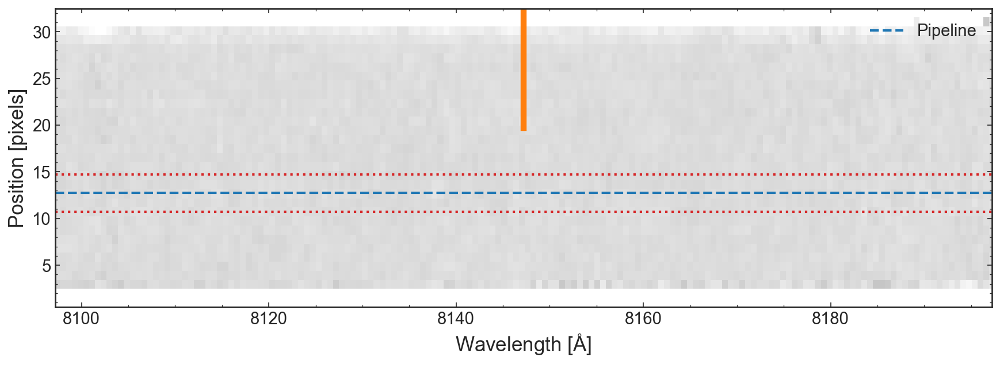

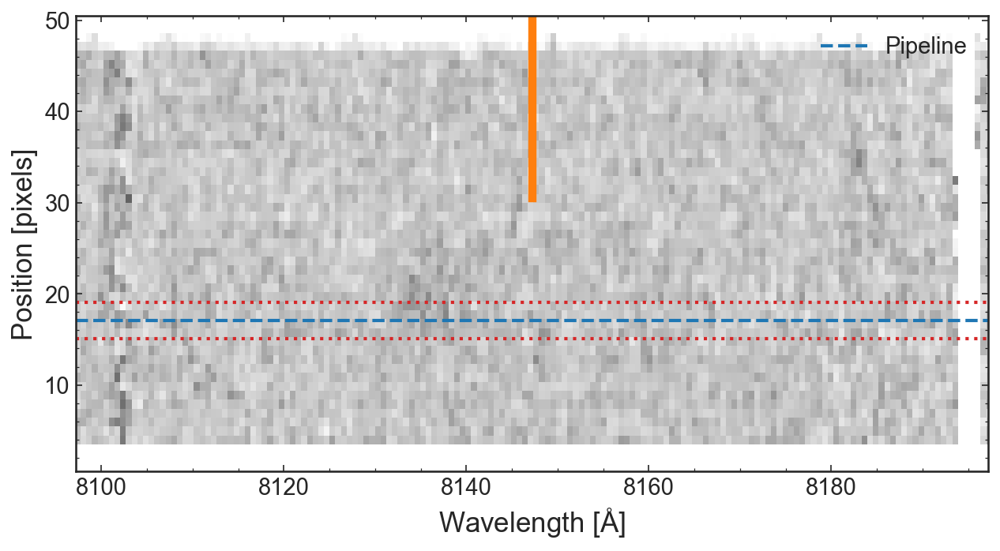

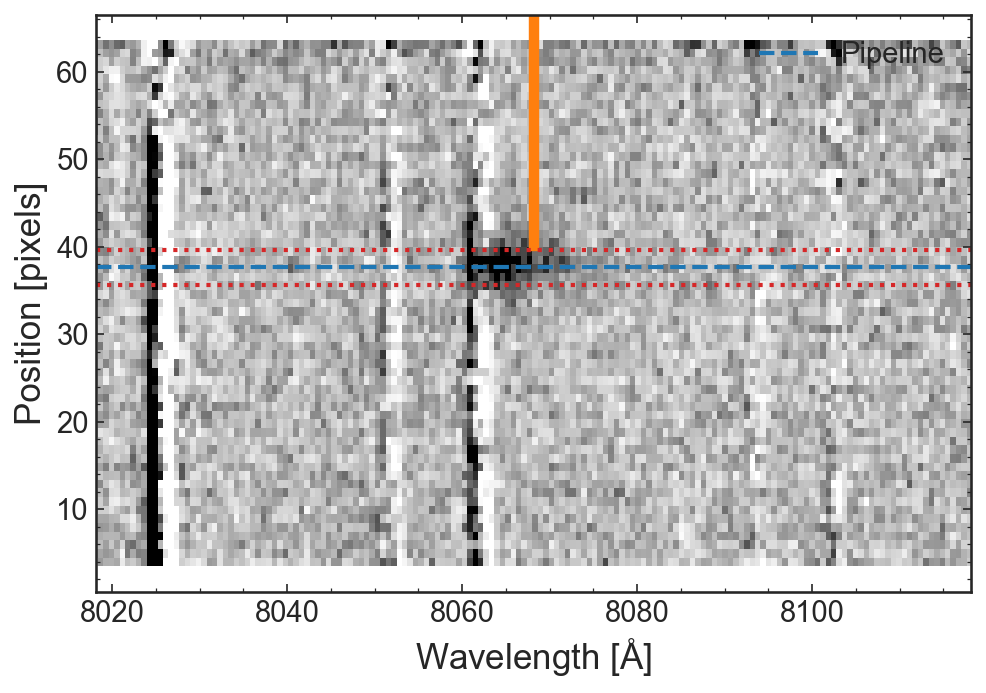

...

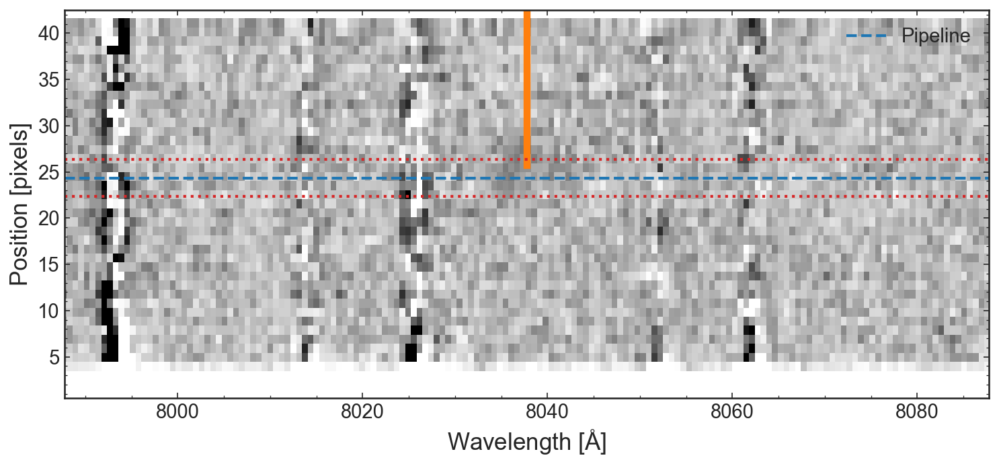

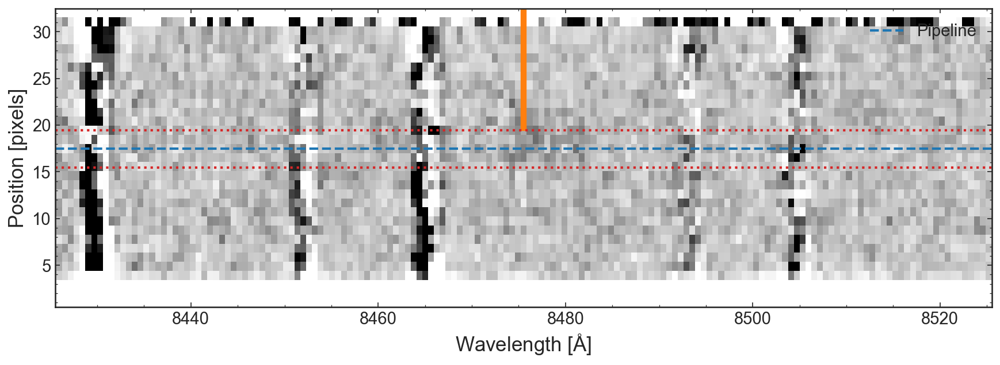

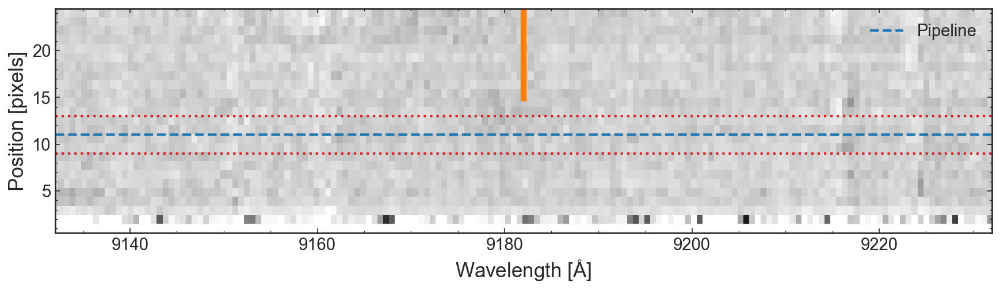

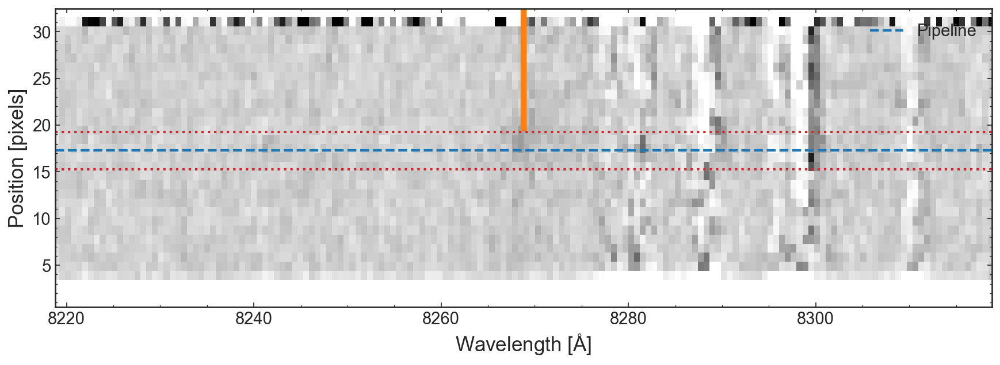

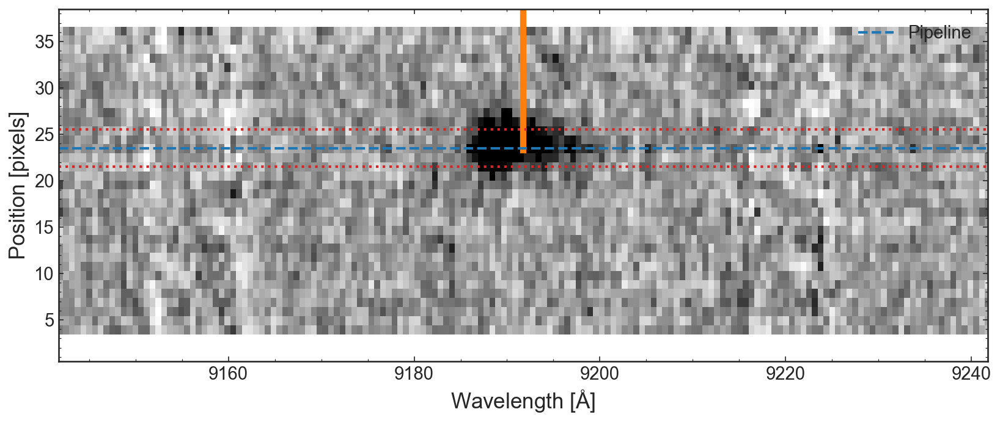

In [25]:
# Line to center on
posy_width = 4.    # Pixel width of extraction window for 1D spectrum (4 pix = PSF from stars ~1")
wave_limA  = 30.   # Wavelength range to plot over (Lya_wave /pm wave_limA)

# Load data
bino_plot = bt.BinoPlotter(fname_data)

for ss, s in pri1_highz.iterrows():
    
#     if ss == 15 or ss==3:

        title    = s['name']
        targetid = s['extnum']
        
#         if 'Hu' in title:
#             s['zspec'] = s['zspec']-0.003
            
        Lya_wave = 1216. * (1. + s['zspec']) # Wavelength to center on
       
        image, ypos = bino_plot.spec2D(target=targetid, wave_lineA=Lya_wave, 
                                       posy_width=posy_width,
                                       wave_limA=wave_limA+20, find_peaks=False,
                                       posy=target_offset_px[targetid-1],
                                       vmin_sig=-0.5, vmax_sig=2, smooth=None)
        
#         ypos = target_offset_px[targetid-1]
#         bino_plot.spec1D(image, wave_lineA=Lya_wave,
#                          posy_med=ypos, posy_width=posy_width,
#                          wave_limA=wave_limA,
#                          StoN=True)
    

# Pri = 2 (MgII at z=2)

In [14]:
pri2_slits = slits[slits.priority == 2]
pri2_slits.reset_index(drop=True, inplace=True)
pri2_slits

,slit,targetnum,name,ra,dec,pmra,pmdec,mag,priority,epoch,type,wave_start,wave_end,side,extnum
0,14,26,3DHST_16990,189.227005,62.226456,0,0,0.001,2,2000,TARGET,7620.968800,10143.602301,B,128
1,17,30,3DHST_21290,189.268066,62.246181,0,0,0.001,2,2000,TARGET,7659.161543,10181.778409,B,139


In [15]:
pri2_tab = pd.read_csv(target_dir+'/target_lists/pri2_MgII_cat_match3DHST.dat', delimiter='\t', escapechar='#', skiprows=1)

pri2_tab

,ID,ra,dec,ID_3DHST,zspec,flux_Lya,EW_Lya,FWHM_kms_Lya
0,434.0,189.227005,62.226456,16990.0,2.2659,11.9,298.9,289.0
1,434.0,189.225769,62.226627,17033.0,2.2659,11.9,298.9,289.0
2,419.0,189.208710,62.233650,18608.0,2.2349,24.4,72.3,476.0
3,395.0,189.183655,62.236137,19140.0,2.2734,20.4,39.2,635.0
4,462.0,189.268066,62.246181,21290.0,2.2128,78.9,195.4,546.0


In [16]:
zspec = np.zeros(len(pri2_slits))
for i, slit in pri2_slits.iterrows():
    pri2_tab_match = pri2_tab[pri2_tab['ID_3DHST'] == float(slit['name'].split('_')[-1])]
    if len(pri2_tab_match) > 0:
        zspec[i] = pri2_tab_match['zspec']

pri2_slits['zspec'] = zspec
pri2_slits['Lya_wave'] = (zspec+1)*121.6
# pri2_highz = pri1_slits.sort_values(by='extnum')[pri2_slits['zspec'] > 5]

# pri2_highz[['extnum','name','ra','dec','side', 'zspec','Lya_wave']]
pri2_slits

/home/cmason/anaconda2/envs/astroconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/home/cmason/anaconda2/envs/astroconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,slit,targetnum,name,ra,dec,pmra,pmdec,mag,priority,epoch,type,wave_start,wave_end,side,extnum,zspec,Lya_wave
0,14,26,3DHST_16990,189.227005,62.226456,0,0,0.001,2,2000,TARGET,7620.968800,10143.602301,B,128,2.2659,397.13344
1,17,30,3DHST_21290,189.268066,62.246181,0,0,0.001,2,2000,TARGET,7659.161543,10181.778409,B,139,2.2128,390.67648


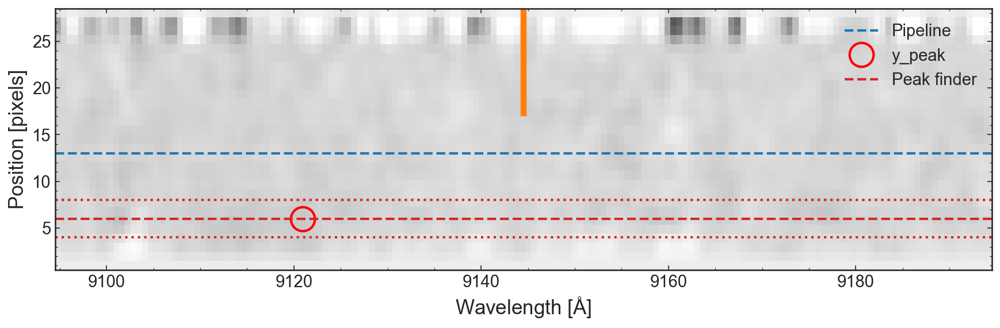

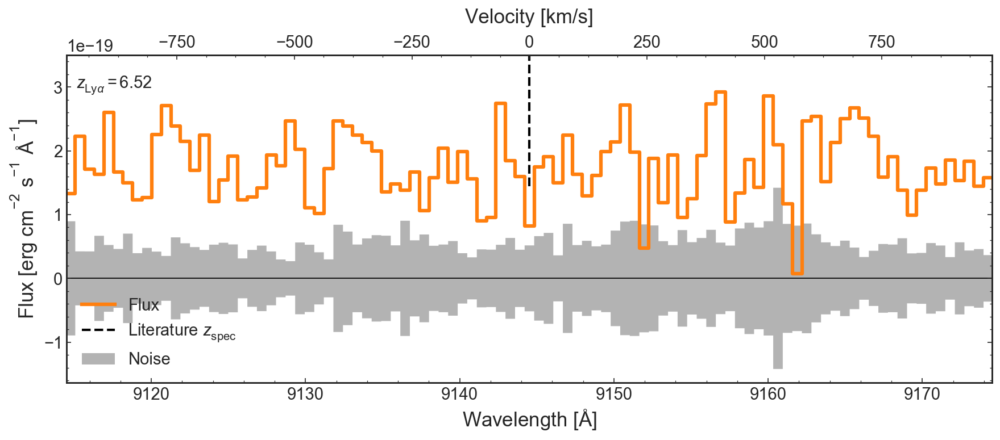

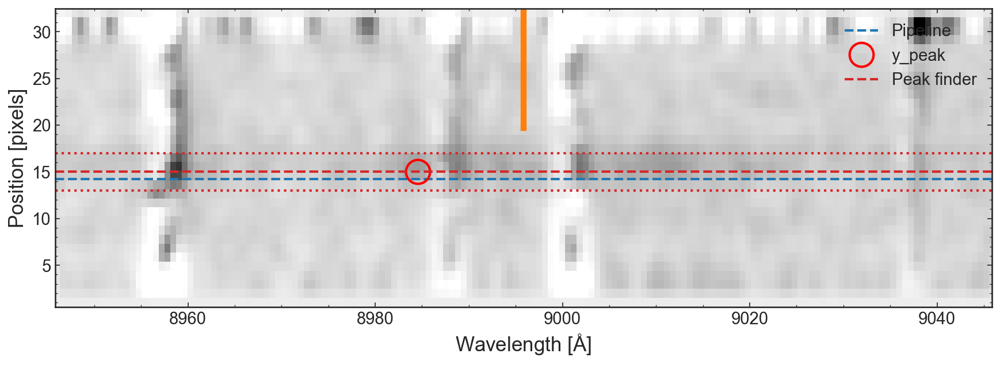

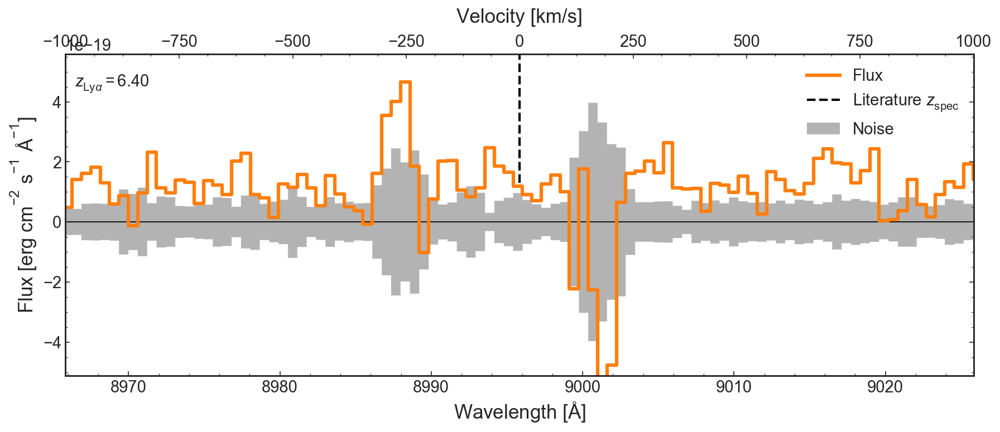

In [20]:
# Line to center on
posy_width = 4.    # Pixel width of extraction window for 1D spectrum (4 pix = PSF from stars ~1")
wave_limA  = 30.   # Wavelength range to plot over (Lya_wave /pm wave_limA)

# Load data
bino_plot = bt.BinoPlotter(fname_data)

for ss, s in pri2_slits.iterrows():
    

        title    = s['name']
        targetid = s['extnum']
                    
        MgII_wave = 2800. * (1. + s['zspec']) # Wavelength to center on
       
        image, ypos = bino_plot.spec2D(target=targetid, wave_lineA=MgII_wave, 
                                       posy_width=posy_width,
                                       wave_limA=wave_limA+20, 
                                       posy=target_offset_px[targetid-1],
                                       vmin_sig=-0.5, vmax_sig=3., smooth=1)
        
        ypos = target_offset_px[targetid-1]
        bino_plot.spec1D(image, wave_lineA=MgII_wave,
                         posy_med=ypos, posy_width=posy_width,
                         wave_limA=wave_limA,
                         StoN=False)

# Pri = 3 (z_phot > 5)

In [21]:
pri3_slits = slits[slits.priority == 3]
pri3_slits.reset_index(drop=True, inplace=True)
pri3_slits

,slit,targetnum,name,ra,dec,pmra,pmdec,mag,priority,epoch,type,wave_start,wave_end,side,extnum
0,7,39,z5_GND_44499,189.105927,62.286846,0,0,0.001,3,2000,TARGET,7612.249551,10134.887037,A,32
1,12,116,z6_GND_44248,189.106491,62.289970,0,0,0.001,3,2000,TARGET,7594.976152,10117.621296,A,33
2,20,149,z6_GND_43953,189.117065,62.294224,0,0,0.001,3,2000,TARGET,7590.107186,10112.754434,A,35
3,11,115,z5_GND_7766,189.139984,62.291809,0,0,0.001,3,2000,TARGET,7647.914103,10170.535614,A,37
4,19,148,z7_GND_8358,189.155319,62.286461,0,0,0.001,3,2000,TARGET,7708.469636,10231.064211,A,38
5,21,150,z6_GND_42333,189.139923,62.308372,0,0,0.001,3,2000,TARGET,7550.979709,10073.644435,A,40
6,15,141,z6_GND_7095,189.165024,62.300190,0,0,0.001,3,2000,TARGET,7646.886069,10169.508195,A,42
7,6,37,z5_GND_42418,189.166550,62.305592,0,0,0.001,3,2000,TARGET,7618.326671,10140.961586,A,43
8,10,103,z6_GND_41463,189.175934,62.311527,0,0,0.001,3,2000,TARGET,7601.848223,10124.490663,A,45
9,18,144,z7_GND_5323,189.178101,62.324318,0,0,0.001,3,2000,TARGET,7531.679970,10054.353934,A,48


In [22]:
pri3_tab = pd.read_csv(target_dir+'/target_lists/pri3_high_z_cat_A.dat', delimiter=' ')
pri3_tab

,ID,z_fink,z_bouw,Hmag,ra,dec
0,z6_GNW_30051,5.58,5.62,25.83,189.455215,62.260632
1,z5_GNW_10084,5.55,5.69,26.19,189.057281,62.166943
2,z5_GNW_15423,5.55,5.56,25.49,188.979294,62.201313
3,z6_GND_16819,5.55,5.62,24.72,189.328232,62.256317
4,z5_GND_14430,5.51,5.56,25.34,189.342285,62.262852
5,z5_GND_30190,5.53,5.56,26.86,189.248978,62.218365
6,z5_GND_42418,5.53,5.69,25.81,189.166550,62.305592
7,z5_GND_15562,5.54,5.69,26.85,189.106384,62.259712
8,z5_GND_44499,5.58,5.56,26.20,189.105927,62.286846
9,z6_GNW_27915,5.56,5.62,26.29,189.474213,62.275700


In [23]:
zspec = np.zeros(len(pri3_slits))
for i, slit in pri3_slits.iterrows():
    pri3_tab_match = pri3_tab[pri3_tab['ID'] == slit['name']]
    if len(pri3_tab_match) > 0:
        zspec[i] = pri3_tab_match['z_fink']

pri3_slits['zspec'] = zspec
pri3_slits['Lya_wave'] = (zspec+1)*121.6

pri3_slits = pri3_slits.sort_values(by='zspec')
pri3_slits.reset_index(drop=True, inplace=True)
pri3_slits

/home/cmason/anaconda2/envs/astroconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/home/cmason/anaconda2/envs/astroconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,slit,targetnum,name,ra,dec,pmra,pmdec,mag,priority,epoch,type,wave_start,wave_end,side,extnum,zspec,Lya_wave
0,21,35,z5_GND_14430,189.342285,62.262852,0,0,0.001,3,2000,TARGET,7620.070047,10142.706247,B,155,5.51,791.616
1,43,76,z6_GND_25400,189.341888,62.232079,0,0,0.001,3,2000,TARGET,7437.722942,9960.439177,B,147,5.51,791.616
2,55,89,z5_GND_32273,189.226334,62.211914,0,0,0.001,3,2000,TARGET,7537.147263,10059.818129,B,124,5.52,792.832
3,59,93,z6_GND_19665,189.248718,62.248444,0,0,0.001,3,2000,TARGET,7708.912055,10231.506625,B,136,5.53,794.048
4,6,37,z5_GND_42418,189.166550,62.305592,0,0,0.001,3,2000,TARGET,7618.326671,10140.961586,A,43,5.53,794.048
5,47,80,z6_GND_14309,189.334091,62.263069,0,0,0.001,3,2000,TARGET,7636.438757,10159.067458,B,153,5.54,795.264
6,23,40,z6_GNW_27915,189.474213,62.275700,0,0,0.001,3,2000,TARGET,7458.791385,9981.505544,B,173,5.56,797.696
7,18,31,z6_GNW_30051,189.455215,62.260632,0,0,0.001,3,2000,TARGET,7401.592583,9924.330111,B,168,5.58,800.128
8,7,39,z5_GND_44499,189.105927,62.286846,0,0,0.001,3,2000,TARGET,7612.249551,10134.887037,A,32,5.58,800.128
9,11,115,z5_GND_7766,189.139984,62.291809,0,0,0.001,3,2000,TARGET,7647.914103,10170.535614,A,37,5.58,800.128


/home/cmason/anaconda2/envs/astroconda3/lib/python3.7/site-packages/Binotools-0.1.0-py3.7.egg/binotools/bino_plot.py:243: RuntimeWarning: divide by zero encountered in true_divide


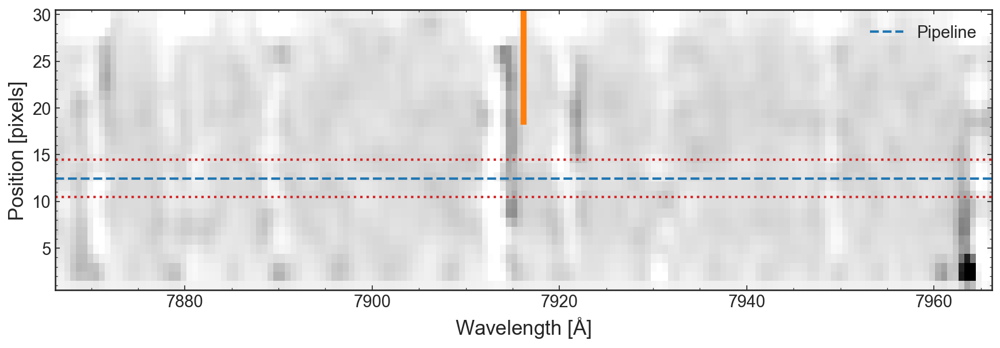

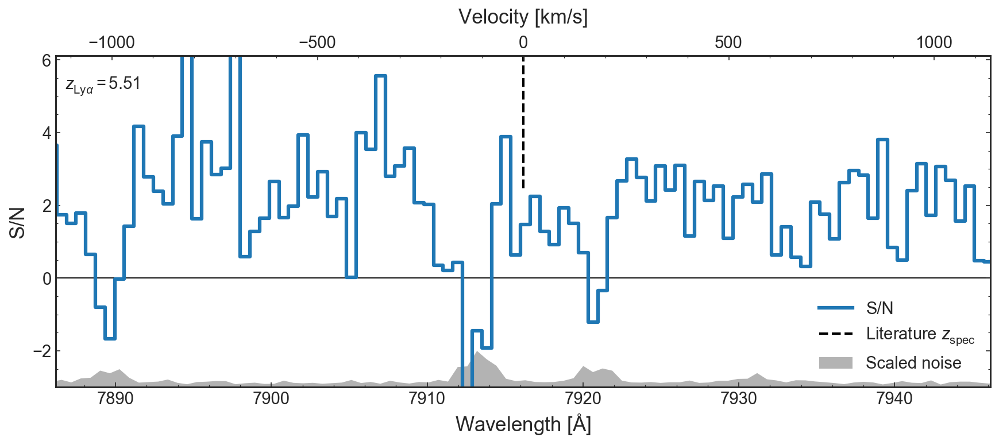

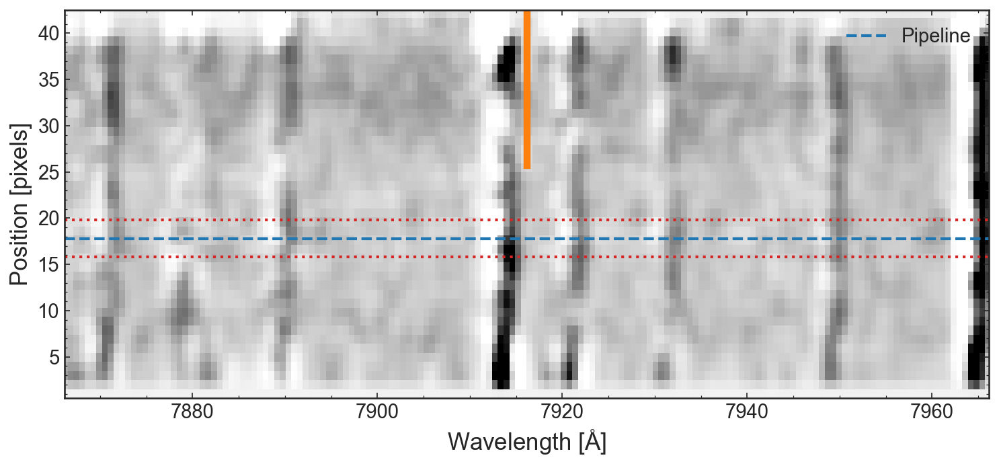

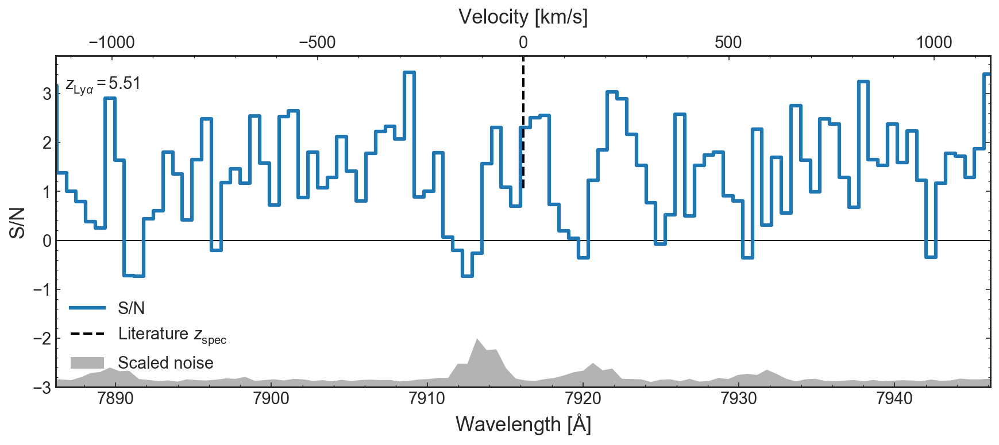

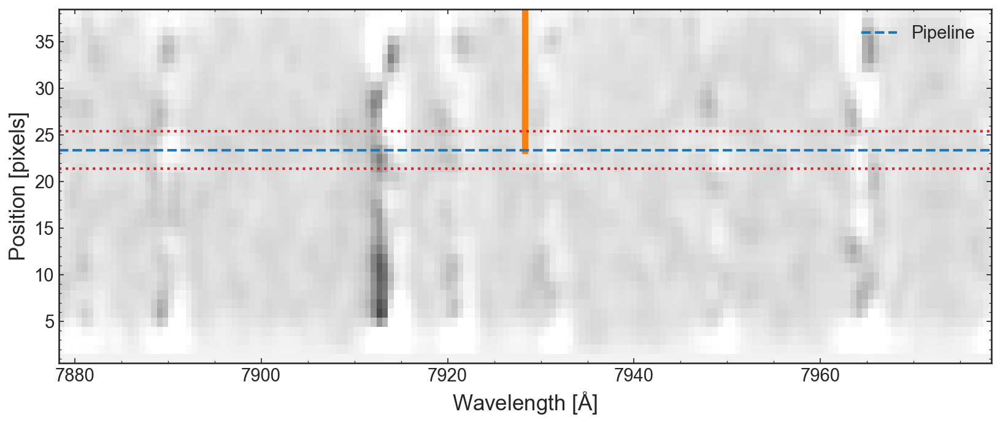

...

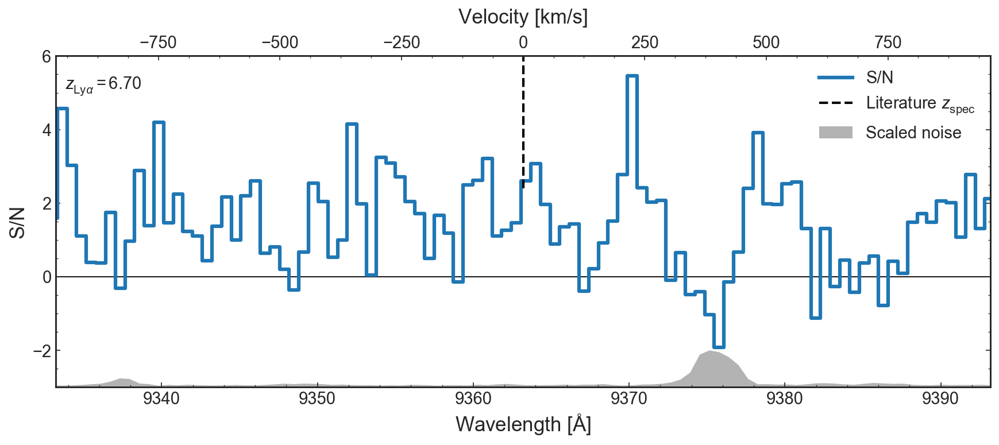

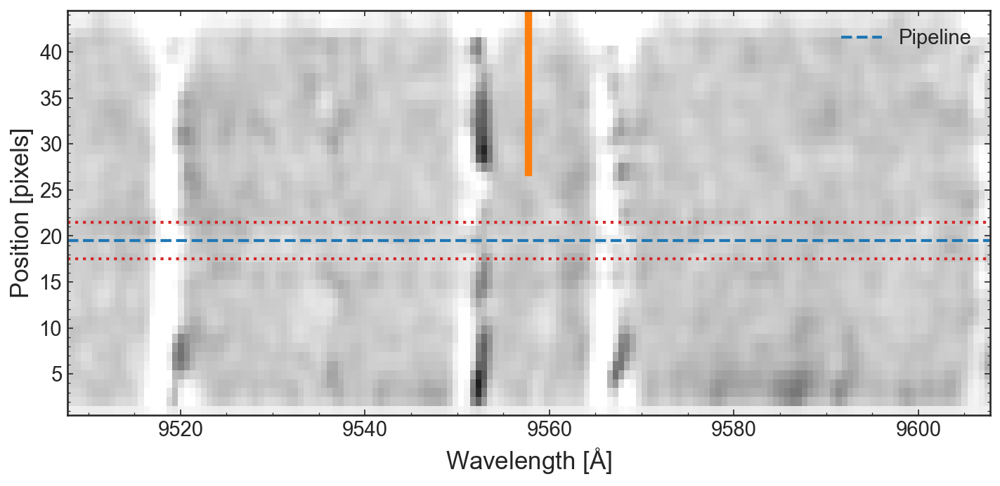

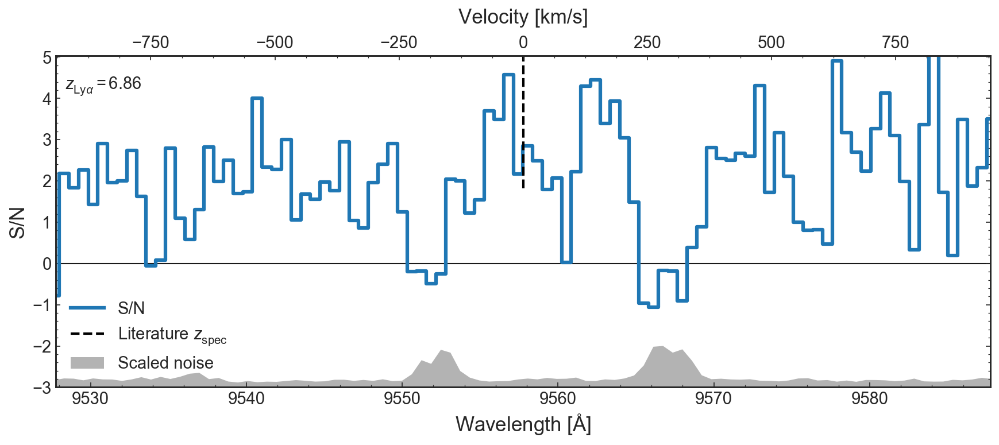

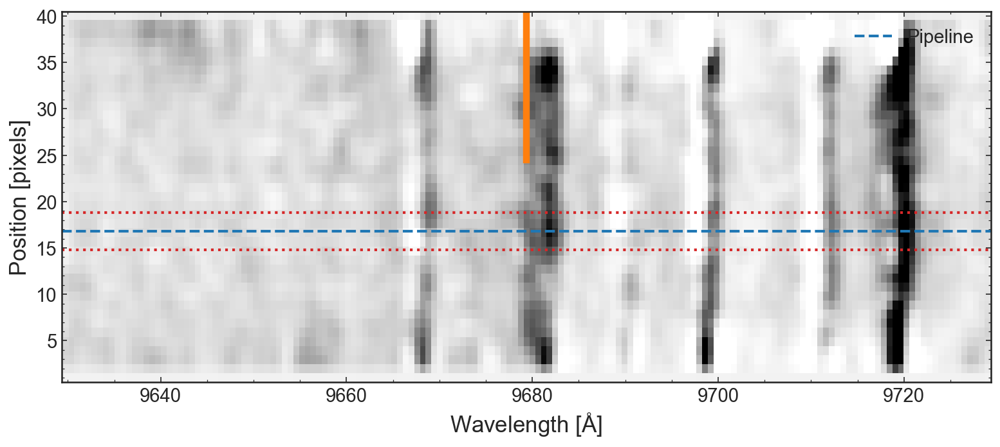

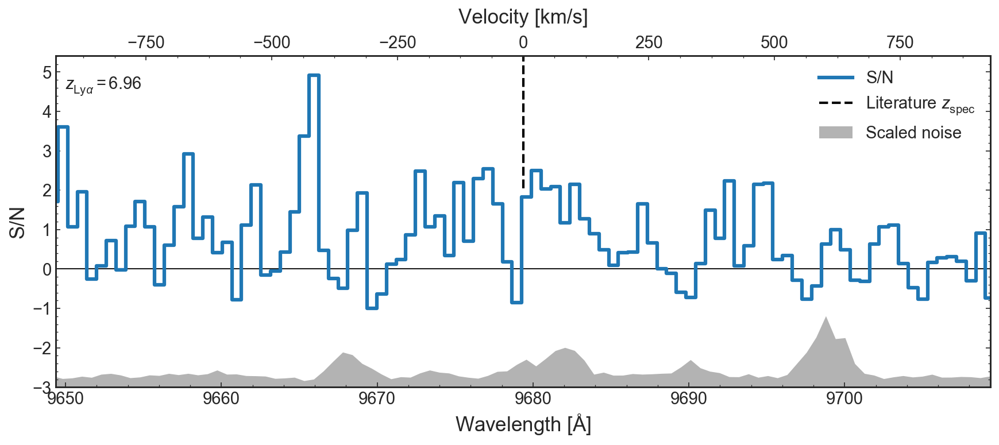

In [24]:
# fname_data = datadir12+"obj-sky_slits_lin_fluxcalib.fits"
# fname_data = datadir12+"obj_abs_slits_lin_fluxcalib.fits"
for ss, s in pri3_slits.iterrows():
    
        title    = s['name']
        targetid = s['extnum']
                    
        MgII_wave = 1216. * (1. + s['zspec']) # Wavelength to center on
       
        image, ypos = bino_plot.spec2D(target=targetid, wave_lineA=MgII_wave, 
                                       posy_width=posy_width,
                                       wave_limA=wave_limA+20, 
                                       posy=target_offset_px[targetid-1], find_peaks=False,
                                       vmin_sig=-0.3, vmax_sig=2.5, smooth=1)
        
        ypos = target_offset_px[targetid-1]
        bino_plot.spec1D(image, wave_lineA=MgII_wave,
                         posy_med=ypos, posy_width=posy_width,
                         wave_limA=wave_limA,
                         StoN=True)

# Pri 6 z~1 fillers

In [41]:
pri6_slits = slits[slits.priority == 6]
pri6_slits.reset_index(drop=True, inplace=True)
pri6_slits

,slit,targetnum,name,ra,dec,pmra,pmdec,mag,priority,epoch,type,wave_start,wave_end,side,extnum
0,22,778,3DHST_15563,188.950745,62.218903,0,0,0.001,6,2000,TARGET,7728.533648,10251.126548,A,1
1,23,818,3DHST_16476,188.950455,62.223740,0,0,0.001,6,2000,TARGET,7698.929822,10221.535552,A,2
2,27,872,3DHST_17848,188.946426,62.230289,0,0,0.001,6,2000,TARGET,7652.275725,10174.901935,A,3
3,33,908,3DHST_19025,188.946198,62.235584,0,0,0.001,6,2000,TARGET,7620.071986,10142.712164,A,4
4,37,931,3DHST_19661,188.949158,62.238186,0,0,0.001,6,2000,TARGET,7609.846845,10132.491259,A,5
5,36,919,3DHST_19285,188.968842,62.237110,0,0,0.001,6,2000,TARGET,7652.164596,10174.789393,A,6
6,35,918,3DHST_19281,188.978577,62.236897,0,0,0.001,6,2000,TARGET,7671.224746,10193.840674,A,7
7,32,902,3DHST_18839,188.993240,62.234818,0,0,0.001,6,2000,TARGET,7710.485386,10233.083389,A,8
8,44,999,3DHST_21508,188.987457,62.247871,0,0,0.001,6,2000,TARGET,7621.921607,10144.558506,A,9
9,46,1033,3DHST_22052,188.994080,62.250793,0,0,0.001,6,2000,TARGET,7616.667809,10139.306658,A,10


In [39]:
pri6_tab = pd.read_csv(target_dir+'target_lists/pri4_filler_cat.dat', delim_whitespace=True)
pri6_tab

,ID,ra,dec,redshift,Jmag
0,98.0,189.086258,62.104534,0.8928,26.208331
1,179.0,189.137466,62.107033,0.8517,26.394193
2,224.0,189.171280,62.108608,0.8662,25.109951
3,233.0,189.134308,62.108662,0.8283,24.970545
4,239.0,189.112320,62.109001,0.9061,24.319583
5,261.0,189.192474,62.109249,0.8598,24.603868
6,288.0,189.135086,62.110245,0.9032,24.693314
7,293.0,189.203094,62.110168,0.8936,24.678760
8,299.0,189.103729,62.110146,0.8840,25.951145
9,304.0,189.201965,62.110268,0.8576,26.266390


## Get zspec

In [66]:
zspec = np.zeros(len(pri6_slits))
for i, slit in pri6_slits.iterrows():
    pri6_tab_match = pri6_tab[pri6_tab['ID'] == float(slit['name'].split('_')[-1])]
    if len(pri6_tab_match) > 0:
        zspec[i] = pri6_tab_match['redshift']

pri6_slits['zspec'] = zspec

pri6_slits_sortz = pri6_slits.sort_values('zspec')
pri6_slits_sortz.reset_index(drop=True, inplace=True)

/home/cmason/anaconda2/envs/astroconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


## Plot

In [68]:
import astropy.io.fits as fits

edge_pix = 4

hdu_data = fits.open(fname_data)

dat2D_all = None
for i, slit in pri6_slits_sortz.iterrows():
    dat2D = hdu_data[slit.extnum].data
        
    # exclude edges
#     dat2D_noedge = dat2D[edge_pix:-edge_pix,:]
    dat2D[:edge_pix]  = np.nan
    dat2D[-edge_pix:] = np.nan
    
    if i == 0:
        dat2D_all = dat2D
    else:
        dat2D_all = np.vstack((dat2D_all, dat2D))    

(8715.0, 9561.6)

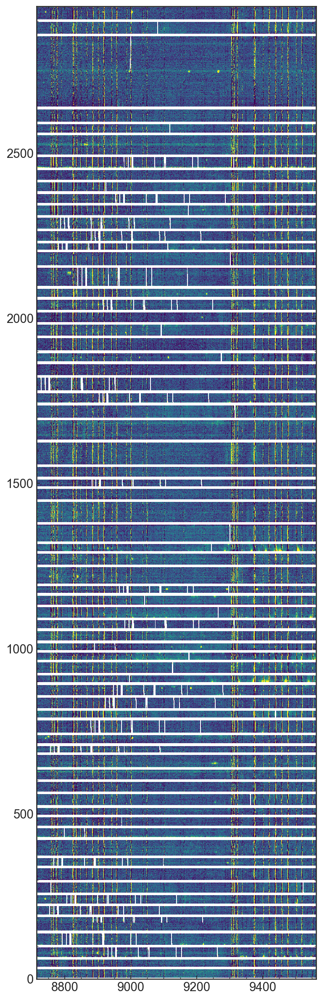

In [69]:
z = np.array([0.75, 0.92])

extent = [bino_plot.waveA.min(), bino_plot.waveA.max(),
          0.5, dat2D_all.shape[0]-0.5]

plt.figure(figsize=(10, 20), dpi=150)
plt.imshow(dat2D_all, extent=extent, vmin=0., vmax=5e-19)

plt.xlim((1+z)*4980)

In [ ]:
# Line to center on
posy_width = 4.    # Pixel width of extraction window for 1D spectrum (4 pix = PSF from stars ~1")
wave_limA  = 30.   # Wavelength range to plot over (Lya_wave /pm wave_limA)

# Load data
bino_plot = bt.BinoPlotter(fname_data)

for ss, s in pri1_highz.iterrows():
    
#     if ss == 15 or ss==3:

        title    = s['name']
        targetid = s['extnum']
        
#         if 'Hu' in title:
#             s['zspec'] = s['zspec']-0.003
            
        Lya_wave = 1216. * (1. + s['zspec']) # Wavelength to center on
       
        image, ypos = bino_plot.spec2D(target=targetid, wave_lineA=Lya_wave, 
                                       posy_width=posy_width,
                                       wave_limA=wave_limA+20, find_peaks=False,
                                       posy=target_offset_px[targetid-1],
                                       vmin_sig=-0.5, vmax_sig=2, smooth=None)
        